In [1]:
# Purpose of the code:
    # Find the mode dominant frequency of change per feature
    # Find the correlation between frequencies and change in MSFC scores in visits 2 & 3

In [2]:
# necessary imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math as math
from scipy import stats
%matplotlib inline

In [3]:
# switch to a proper directory to access the data
pwd

'/camhpc/home/nhassanp/jupyter-notebook-dir'

In [4]:
cd /camdatalake/bronze/verily_ms/device/

/camdatalake/bronze/verily_ms/device


In [5]:
pwd

'/camdatalake/bronze/verily_ms/device'

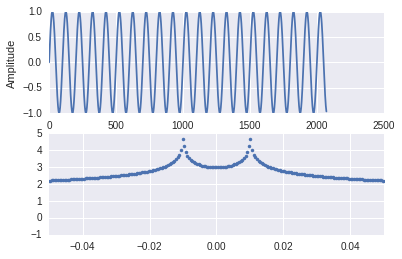

In [6]:
# test run for Fast Fourier Transform (FFT)
import numpy as np
import scipy as sy
import scipy.fftpack as syfp
import pylab as pyl
# create a fake signal
dt = 0.02071 
t = dt*np.arange(100000)             ## time at the same spacing of your data
u = np.sin(2*np.pi*t*.01)            ## Note freq=0.01 Hz
# Do FFT analysis of array
FFT = sy.fft(u)
# Getting the related frequencies
freqs = syfp.fftfreq(len(u), dt)     ## added dt, so x-axis is in meaningful units
# Create subplot windows and show the plots
pyl.subplot(211)
pyl.plot(t, u)
pyl.xlabel('Time')
pyl.ylabel('Amplitude')
pyl.subplot(212)
pyl.plot(freqs, sy.log10(abs(FFT)), '.')  ## it's important to have the abs here
pyl.xlim(-.05, .05)                       ## zoom into see what's going on at the peak
pyl.show()

In [7]:
# download and read the data

# FeatureDay: Average value of the features for each day of study. Days are listed as 
# DayOfStudy

# FeatureStudy: Features for the entire study period.For the at home features, 
# the reported value is the median of the observed day level values.

import gzip, csv
with gzip.open("FeaturesDay.csv.gz", "rt", newline="") as file:
    FeatureDay = pd.read_csv(file, header = 0)

with gzip.open("FeaturesStudy.csv.gz", "rt", newline="") as file:
    FeatureStudy = pd.read_csv(file, header = 0)

In [8]:
# extract the list of features in the dataset
list(FeatureDay.columns)

['user_email',
 'gls_subject_code',
 'msfc_walk_composite_1',
 'msfc_9hpt_composite_1',
 'msfc_sdmt_composite_1',
 'msfc_snellen_composite_1',
 'msfc_composite_1',
 'msfc_walk_composite_residual_1',
 'msfc_9hpt_composite_residual_1',
 'msfc_sdmt_composite_residual_1',
 'msfc_snellen_composite_residual_1',
 'msfc_walk_composite_2',
 'msfc_9hpt_composite_2',
 'msfc_sdmt_composite_2',
 'msfc_snellen_composite_2',
 'msfc_composite_2',
 'msfc_walk_composite_residual_2',
 'msfc_9hpt_composite_residual_2',
 'msfc_sdmt_composite_residual_2',
 'msfc_snellen_composite_residual_2',
 'msfc_walk_composite_3',
 'msfc_9hpt_composite_3',
 'msfc_sdmt_composite_3',
 'msfc_snellen_composite_3',
 'msfc_composite_3',
 'msfc_walk_composite_residual_3',
 'msfc_9hpt_composite_residual_3',
 'msfc_sdmt_composite_residual_3',
 'msfc_snellen_composite_residual_3',
 'sex',
 'height_inch',
 'weight_lbs',
 'bmi',
 'age_years',
 'dayofstudy',
 'movement_rate',
 'duration_movement_count',
 'stance',
 'swing',
 'turn_a

In [9]:
# found list of unique IDs for patients
patient_IDs = list(FeatureDay['gls_subject_code'].unique())
patient_IDs

['H800001',
 'H800002',
 'H800003',
 'H800004',
 'H800006',
 'H800007',
 'H800008',
 'H800009',
 'H800010',
 'H800011',
 'H800013',
 'H800014',
 'H800016',
 'H800017',
 'H800018',
 'H800019',
 'H800020',
 'H800021',
 'H800022',
 'H800023',
 'H800024',
 'H800025',
 'H800005',
 'H800012',
 'H800015']

In [10]:
# 10 free-living features with high correlation to MSFC

# ['idle_minutes',
#  'turn_vel_std_ankle',
#  'swing',
#  'stance',
#  'duration_movement_count',
#  'turn_vel_max_ankle',
#  'turn_duration_ankle',
#  'duration_rem_count',
#  'rem_percent',
#  'movement_rate']

free_living_features_highly_correlated = ['idle_minutes',
 'turn_vel_std_ankle',
 'swing',
 'stance',
 'duration_movement_count',
 'turn_vel_max_ankle',
 'turn_duration_ankle',
 'duration_rem_count',
 'rem_percent',
 'movement_rate']

In [11]:
# 19 highly correlated at-home features (structured activity) to MSFC

# ['mean_pvt_delay_7_at_home',
#  'mobility_stance_at_home',
#  'mean_pvt_delay_at_home',
#  'pq_nondominant_rhythm_at_home',
#  'pq_nondominant_median_at_home',
#  'pq_dominant_rhythm_at_home',
#  'turn_vel_max_at_home',
#  'mobility_swing_at_home',
#  'zx_dominant_num_correct_at_home',
#  'turn_vel_std_at_home',
#  'turn_duration_ankle_at_home',
#  'turn_vel_max_ankle_at_home',
#  'mean_pvt_delay_5_at_home',
#  'zx_nondominant_median_at_home',
#  'zx_nondominant_num_correct_at_home',
#  'mean_pvt_delay_3_at_home',
#  'turn_vel_std_ankle_at_home',
#  'mobility_activity_at_home_time',
#  'mean_pvt_delay_1_at_home']

at_home_features_highly_correlated = ['mean_pvt_delay_7_at_home',
 'mobility_stance_at_home',
 'mean_pvt_delay_at_home',
 'pq_nondominant_rhythm_at_home',
 'pq_nondominant_median_at_home',
 'pq_dominant_rhythm_at_home',
 'turn_vel_max_at_home',
 'mobility_swing_at_home',
 'zx_dominant_num_correct_at_home',
 'turn_vel_std_at_home',
 'turn_duration_ankle_at_home',
 'turn_vel_max_ankle_at_home',
 'mean_pvt_delay_5_at_home',
 'zx_nondominant_median_at_home',
 'zx_nondominant_num_correct_at_home',
 'mean_pvt_delay_3_at_home',
 'turn_vel_std_ankle_at_home',
 'mobility_activity_at_home_time',
 'mean_pvt_delay_1_at_home']

In [12]:
def remove_outliers(feature_values, day_of_study):
    # a function to remove outliers from inputs and return filtered inputs as ouputs
    m = 1.5 # set the distance threshold from the mean
    mean = feature_values.mean()
    std = feature_values.std()
    tuples = list(zip(feature_values,day_of_study))
    filtered_values = []
    for (x,y) in tuples:
        if (x >= mean - m * std) & (x <= mean + m * std):
            filtered_values.append((x,y))
    unzip_filtered_values = list(zip(*filtered_values))
    # check for missing values
    if len(unzip_filtered_values) > 0:
        return pd.Series(list(unzip_filtered_values[0])), pd.Series(list(unzip_filtered_values[1]))
    else:
        return pd.Series([]),day_of_study

(array([7]),)
[ 0.16326531]


/opt/python3/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
/opt/python3/lib/python3.5/site-packages/numpy/core/numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


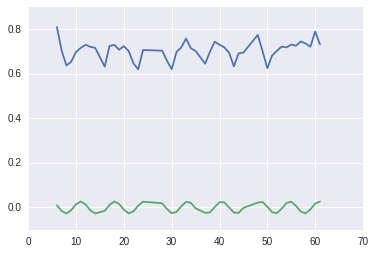

In [13]:
# test run to extract the most dominant frequency of change for a specific feature in a patient
from scipy.fftpack import fft, ifft, fftfreq
col_1 = 'stance'
col_2 = 'dayofstudy'
df = FeatureDay[FeatureDay['gls_subject_code'] == 'H800010'][[col_1,col_2]]
df.sort(col_2, inplace = True)
x = df[col_2]
y = df[col_1]
y,x = remove_outliers(y,x)
# plot the original signal
plt.plot(x, y)
# we want to find the dominant signals that shape this signal(the frequency)
# the rest of the signals/frequencies will be considered as noise
# FFT returns a complex array, which is the transform of the signal from time to frequency
# The idea is that any signal with any shape, can be generated by mixing some sine shape signals
# FFT is supposed to decompose the original signal, and return the frequencies of sine waves that can regenerate the original signal
hn = y
N = len(hn)
Hn = fft(hn)
Hn
# we have positive/negative frequencies in Hn. each element of Hn is a frequency 
# we want to know how the Hn is organized and fftfreq helps us with that. it returns some frequencies
freq = fftfreq(N)
# the frequencies are stired increamentally and we also have negative values of the frequencies
# get list of non-negative frequencies, ignore the first freqeuncy which is 0
ind_freq = np.arange(1,(N//2)+1)
ind_freq_neg = [i * -1 for i in ind_freq]
# calculate the power spectral density(PSD)   
psd = abs(Hn[ind_freq]) ** 2 + abs(Hn[ind_freq_neg]) ** 2
# the picks in PSD show the frequencies of real signals and the rest are not(noise)
plt.plot(freq[ind_freq],psd)
plt.xlim(0,1)
# we can cut out the noise by just taking into account the main frequincies of our signal
# put a cut off on psd
ind = np.where(psd > 0.7)
print(ind)
# at what frequencies we have the picks?(the dominanat frequencies of the original wave)
print(freq[ind_freq[ind]])
# plt.axvline(0.16326531)
# plt.axvline(0.18367347)
# make a new Hn and let the contribution on the selected frequencies in it
# the negative frequencies are also important
Hn_cut = np.zeros_like(Hn)
Hn_cut[ind_freq[ind]] = Hn[ind_freq[ind]]
Hn_cut[[i*-1 for i in ind_freq[ind]]] = Hn[[i*-1 for i in ind_freq[ind]]]
# reconstruct the original wave
# the new signal just contains the new set of frequencies
hn_cut = ifft(Hn_cut)
# plot and compare the new signal to the original one
plt.clf()
plt.plot(x, y)
plt.plot(x,hn_cut)

In [ ]:
# start the real work! 
# extract the most dominant frequency of change in all sensor measured features

In [14]:
# combine all 29 highly correlated features in one list
    # 10 free-living features
    # 19 at-home measurments (structured activity)
all_highly_corr_features = free_living_features_highly_correlated + at_home_features_highly_correlated

In [15]:
def extract_the_most_dominant_freq_and_recosndtruct(y):
    # find the most dominant frequency in the original signal y
    hn = y
    N = len(hn)
    Hn = fft(hn)
    freq = fftfreq(N)
    ind_freq = np.arange(1,(N//2)+1)
    ind_freq_neg = [i * -1 for i in ind_freq]  
    psd = abs(Hn[ind_freq]) ** 2 + abs(Hn[ind_freq_neg]) ** 2
    ind = np.where(psd == max(psd))
    dominant_freq =  freq[ind_freq[ind]]
    # reconstruct the signal using the most dominant frequency
    Hn_cut = np.zeros_like(Hn)
    Hn_cut[ind_freq[ind]] = Hn[ind_freq[ind]]
    Hn_cut[[i*-1 for i in ind_freq[ind]]] = Hn[[i*-1 for i in ind_freq[ind]]]
    hn_cut = ifft(Hn_cut)
    # return dominant frequency and the reconstructed signal
    return dominant_freq, hn_cut

In [16]:
# create a data frame with frequency of the most dominant signal per patient for each feature
# row: patient number
# columns: 29 freatures
# content: the most dominant frequency of the pattern signal the patient shows for a feature
    # nan: when the patient is missing more than 50% of the data values
df_freq = pd.DataFrame()
df_freq['patient_IDs'] = patient_IDs
# loop on features
for feature in all_highly_corr_features:
    col_1 = feature
    col_2 = 'dayofstudy'
    freqs = []
    # loop on patients
    for id in patient_IDs:
        # extract the data
        df = FeatureDay[FeatureDay['gls_subject_code'] == id][[col_1,col_2]]
        # check how much of data is missing
        null_values = df[col_1].isnull().sum()
        # return nan if more than 50% of the data is missing
        if (null_values > (len(df[col_1]))/2):
            freqs.append(np.nan)
        else:
            # sort the data based on days of the study
            df.sort(col_2, inplace = True)
            x = df[col_2]
            y = df[col_1]
            # remove outliers
            y,x = remove_outliers(y,x)
            # extract the most frequency
            freq, reconstructed_signal = extract_the_most_dominant_freq_and_recosndtruct(y)
            # add the extracted frequency to a list
            freqs.append(freq)
    # create a column in the data frame for frequency of change of a feature per patient
    df_freq[feature] = freqs

/opt/python3/lib/python3.5/site-packages/ipykernel/__main__.py:22: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)


In [17]:
df_freq

,patient_IDs,idle_minutes,turn_vel_std_ankle,swing,stance,duration_movement_count,turn_vel_max_ankle,turn_duration_ankle,duration_rem_count,rem_percent,...,turn_vel_std_at_home,turn_duration_ankle_at_home,turn_vel_max_ankle_at_home,mean_pvt_delay_5_at_home,zx_nondominant_median_at_home,zx_nondominant_num_correct_at_home,mean_pvt_delay_3_at_home,turn_vel_std_ankle_at_home,mobility_activity_at_home_time,mean_pvt_delay_1_at_home
0,H800001,[0.111111111111],[0.133333333333],[0.46511627907],[0.25],NaN,[0.377777777778],[0.3],NaN,NaN,...,NaN,NaN,NaN,[0.488888888889],NaN,NaN,[0.488888888889],NaN,NaN,[0.159090909091]
1,H800002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,H800003,[0.28125],[0.16],[0.163265306122],[0.137254901961],NaN,[0.12],[0.24],NaN,NaN,...,NaN,NaN,NaN,[0.0925925925926],NaN,NaN,[0.448275862069],NaN,NaN,[0.122807017544]
3,H800004,[0.316666666667],[0.0961538461538],[0.30612244898],[0.0408163265306],[0.309523809524],[0.0980392156863],[0.326086956522],[0.285714285714],[0.047619047619],...,NaN,NaN,NaN,[0.0555555555556],NaN,NaN,[0.0175438596491],NaN,NaN,[0.25]
4,H800006,[0.0576923076923],[0.288461538462],[0.0869565217391],[0.0392156862745],NaN,[0.02],[0.0434782608696],NaN,NaN,...,NaN,NaN,NaN,[0.025],NaN,NaN,[0.139534883721],NaN,NaN,[0.488372093023]
5,H800007,[0.075],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,H800008,[0.48],[0.219512195122],[0.404761904762],[0.175],[0.235294117647],[0.3],[0.195652173913],[-0.5],[0.4],...,NaN,NaN,NaN,[0.0204081632653],NaN,NaN,[0.34693877551],NaN,NaN,[0.02]
7,H800009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,H800010,[0.258620689655],[0.16],[0.12],[0.163265306122],[0.228571428571],[0.156862745098],[0.153846153846],NaN,NaN,...,NaN,NaN,NaN,[0.22],NaN,NaN,[0.0196078431373],NaN,NaN,[0.0212765957447]
9,H800011,[0.0980392156863],[0.0243902439024],[0.138888888889],[0.473684210526],NaN,[0.025],[0.282051282051],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/opt/python3/lib/python3.5/site-packages/ipykernel/__main__.py:18: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
/opt/python3/lib/python3.5/site-packages/numpy/core/numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/opt/python3/lib/python3.5/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


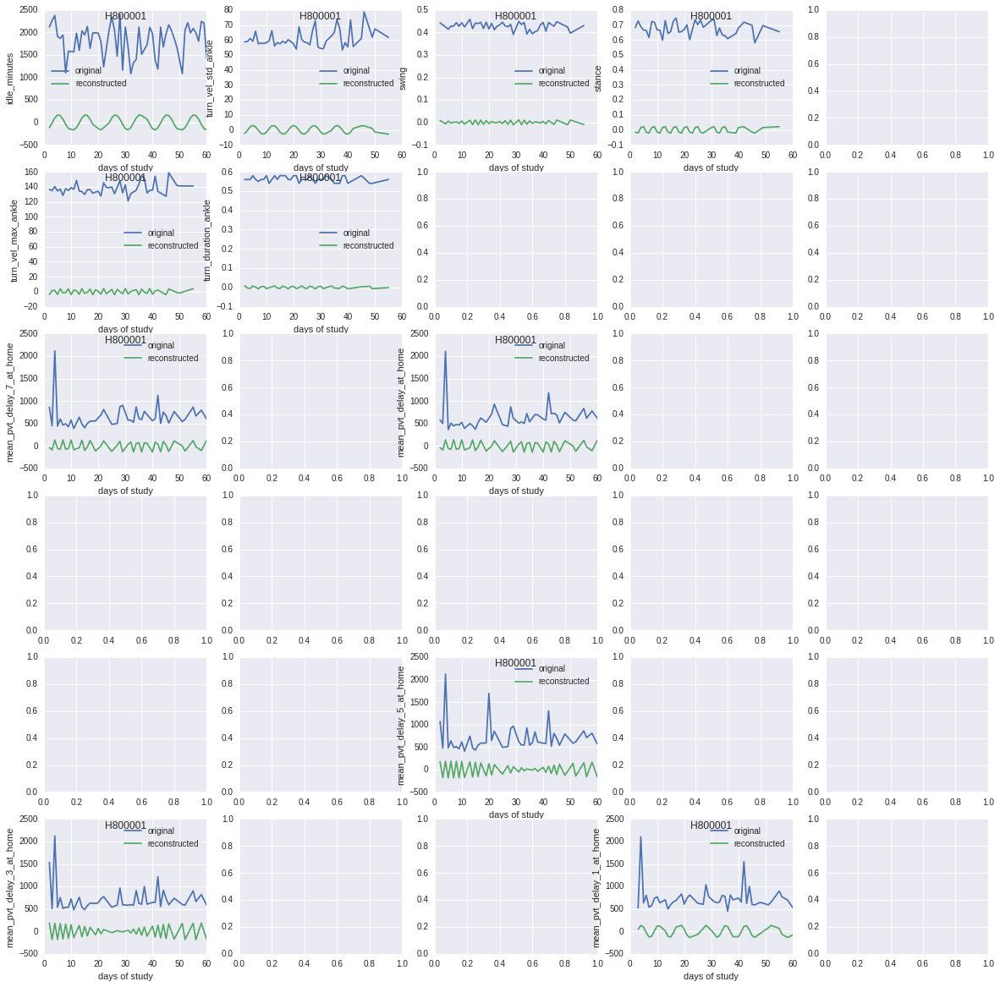

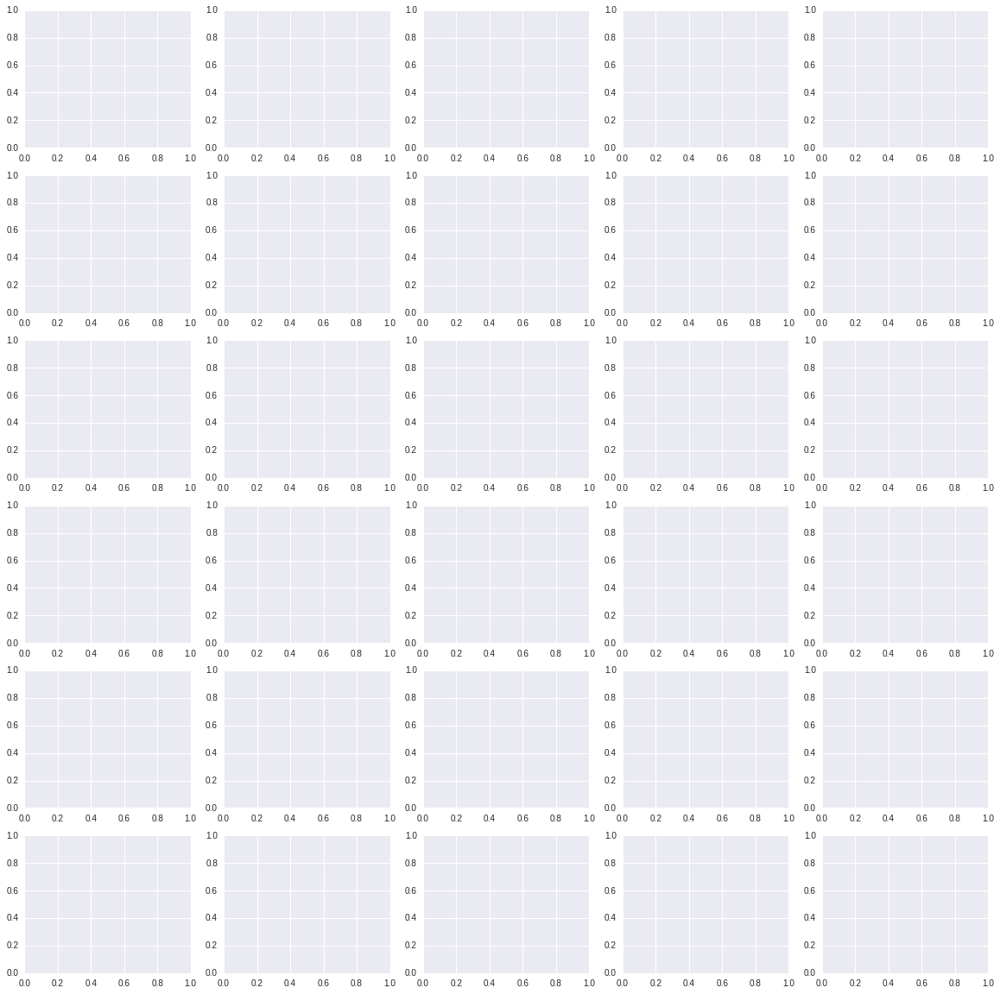

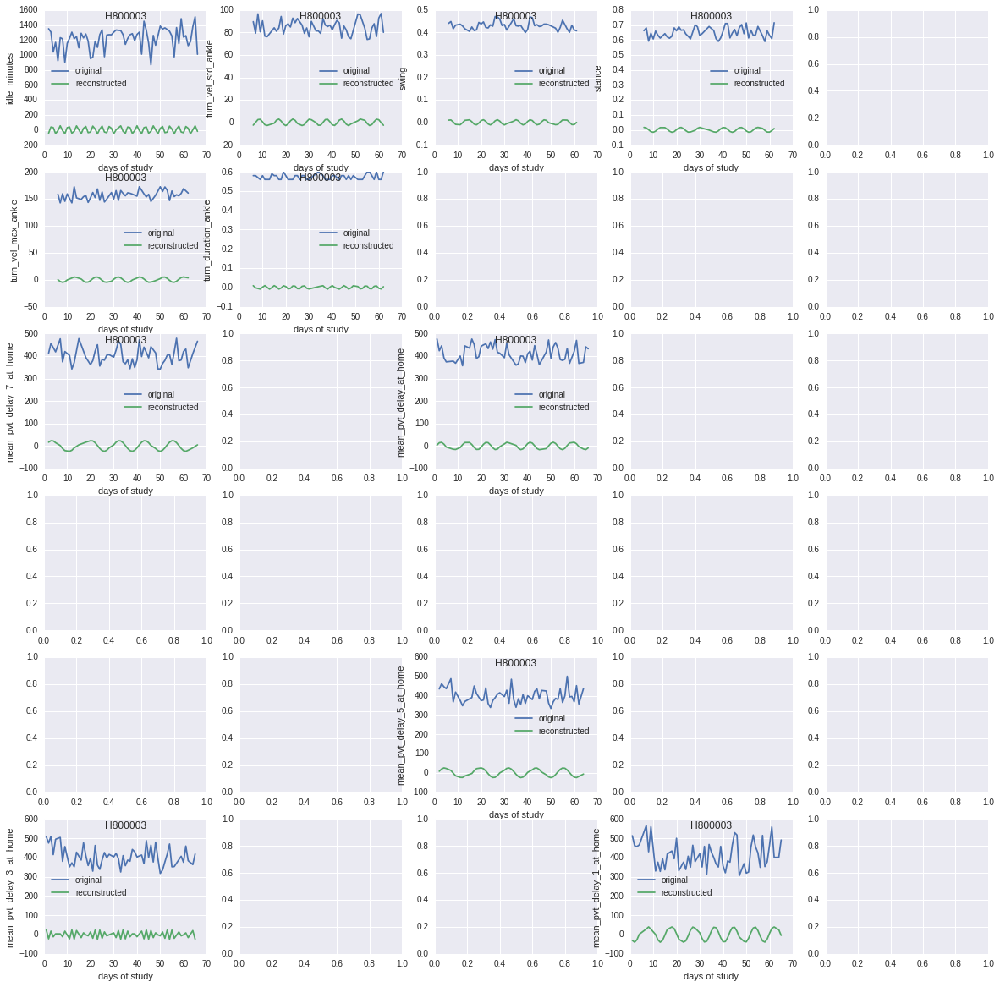

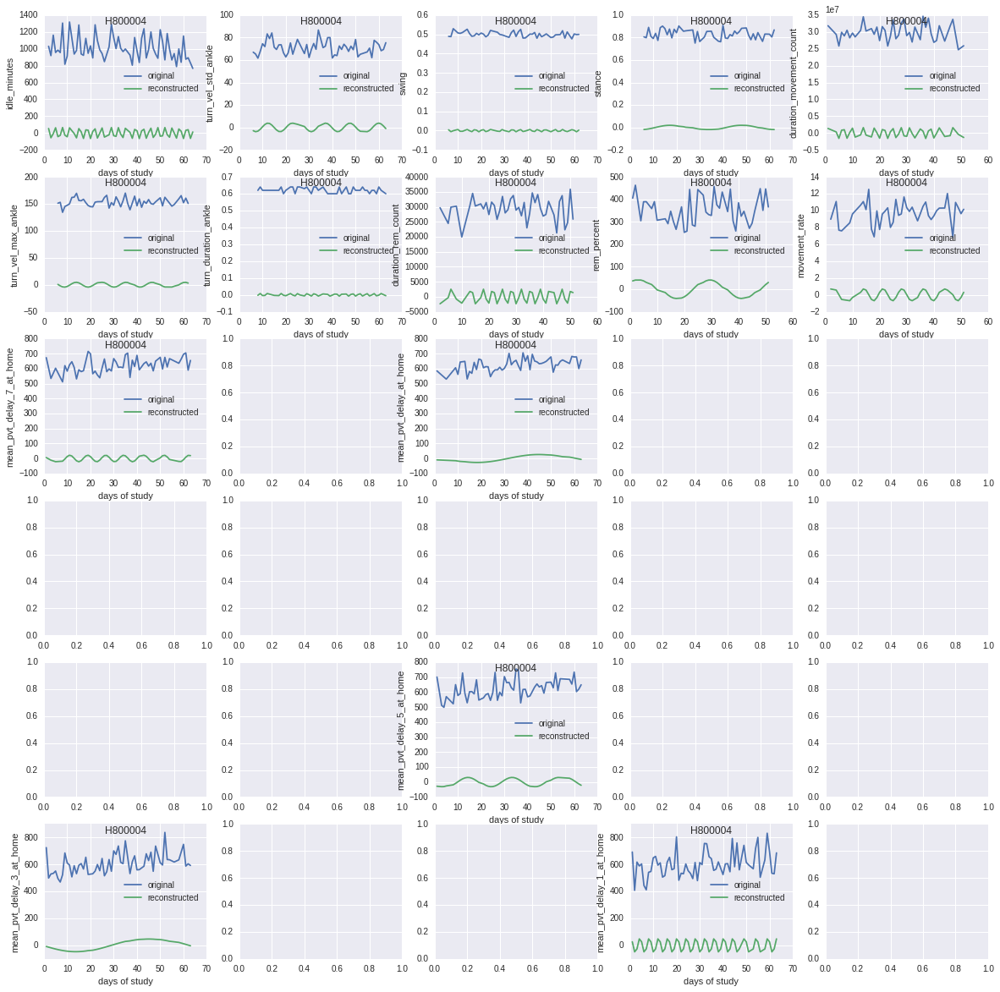

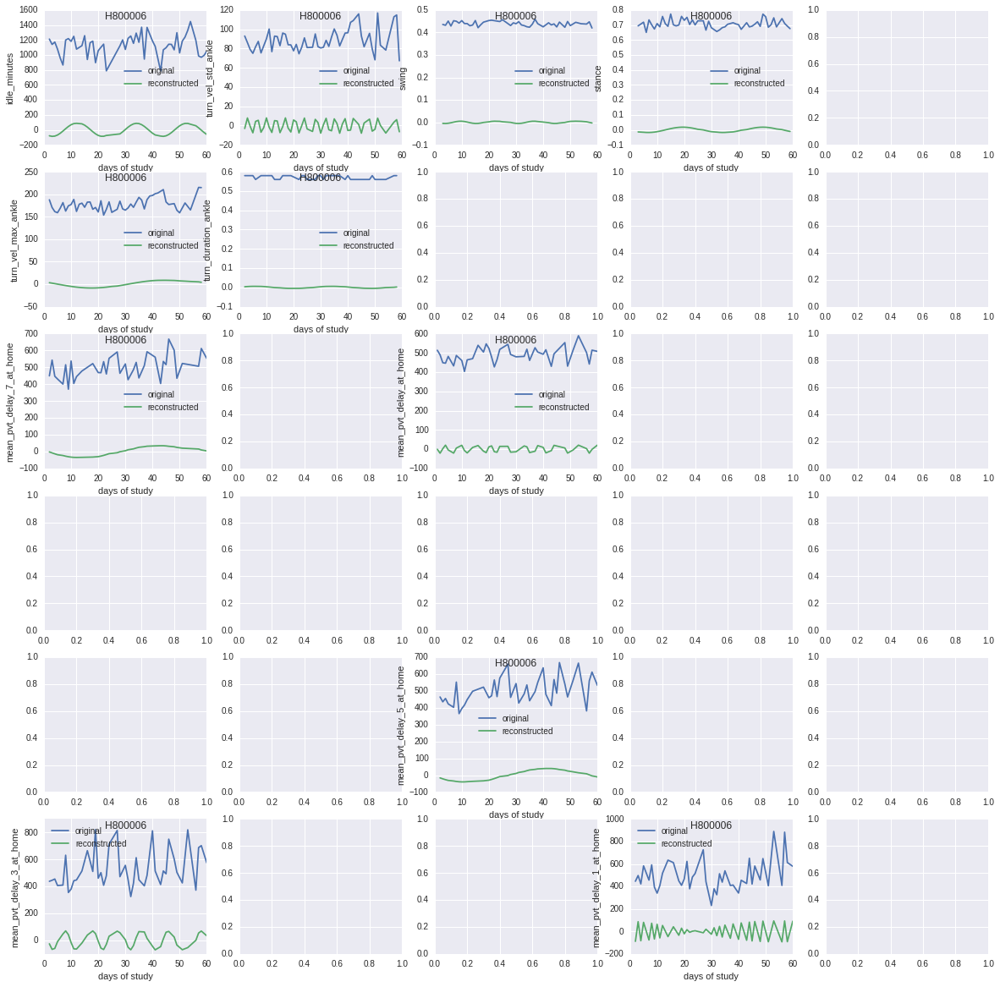

...

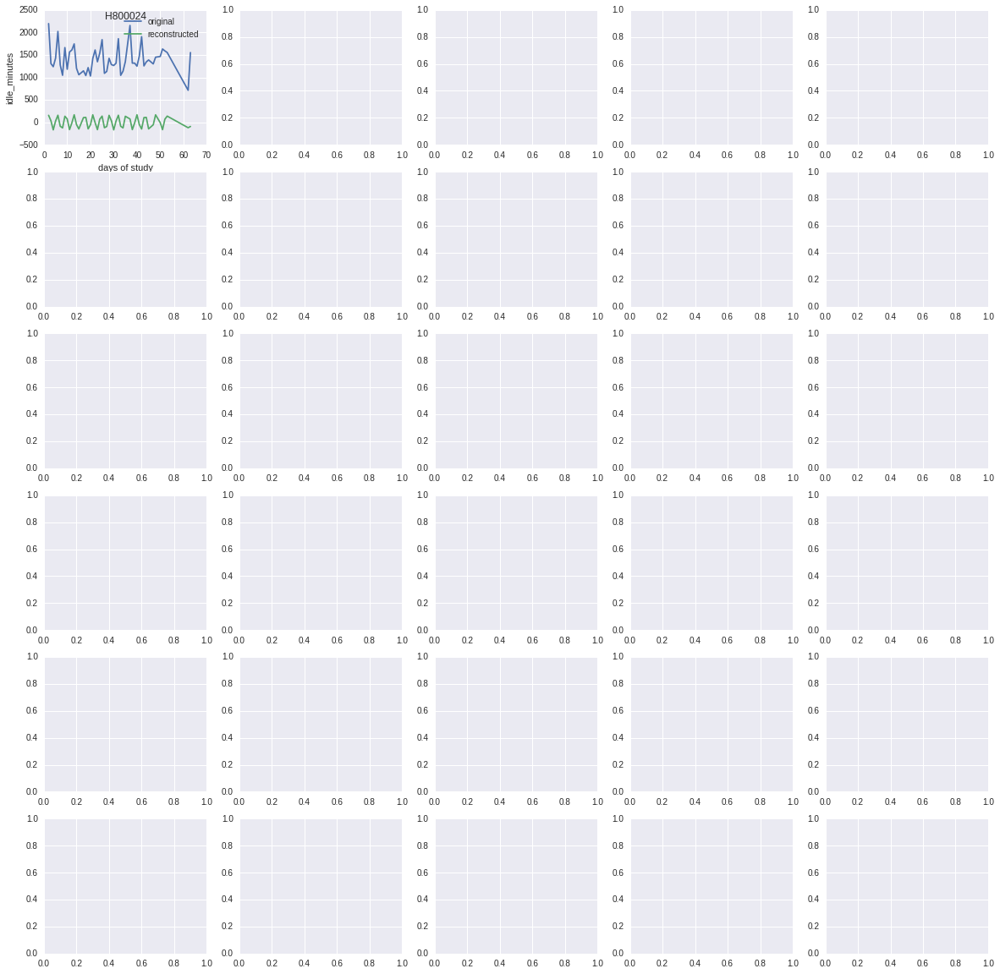

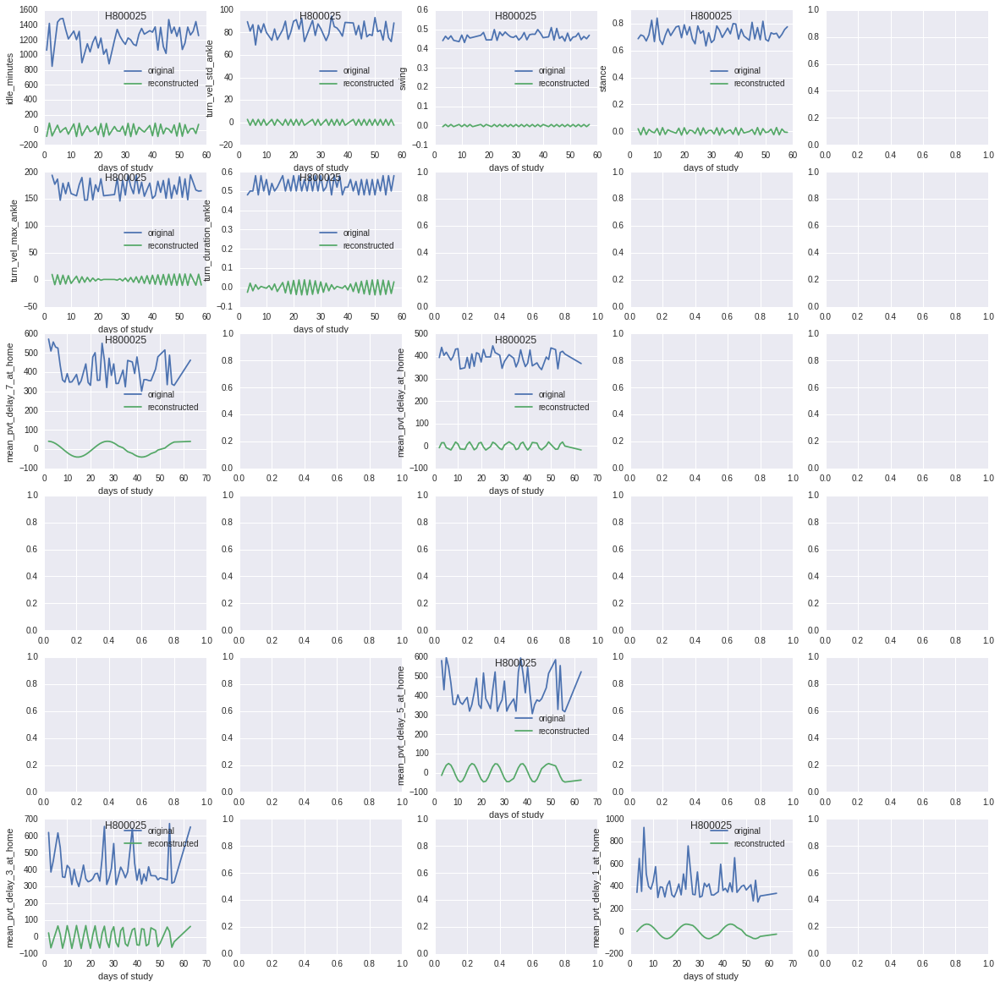

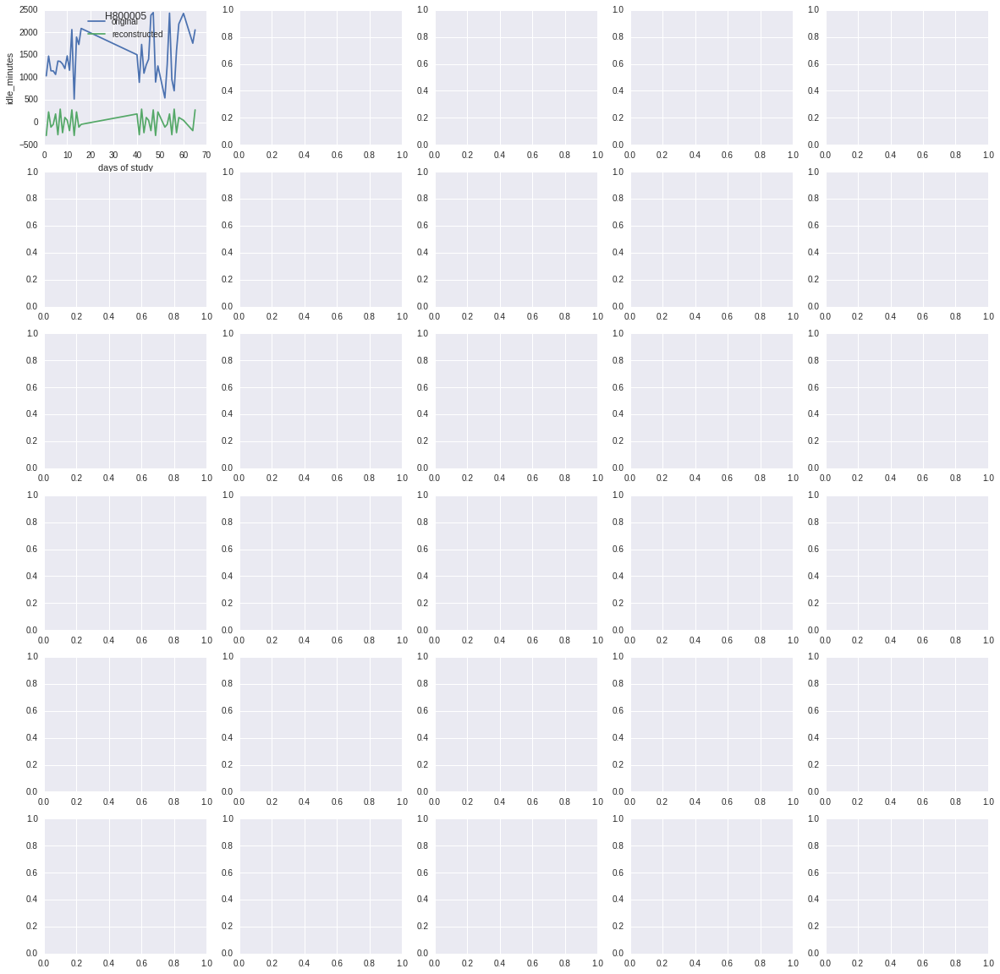

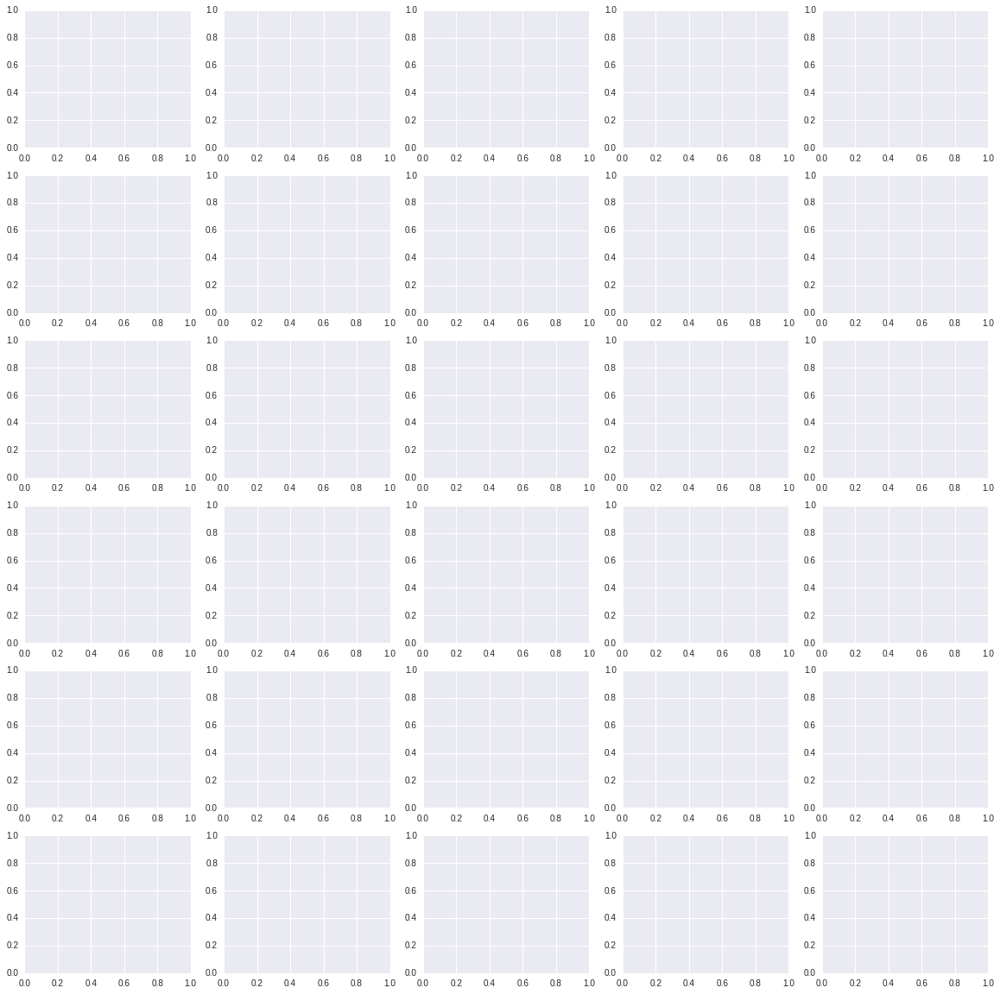

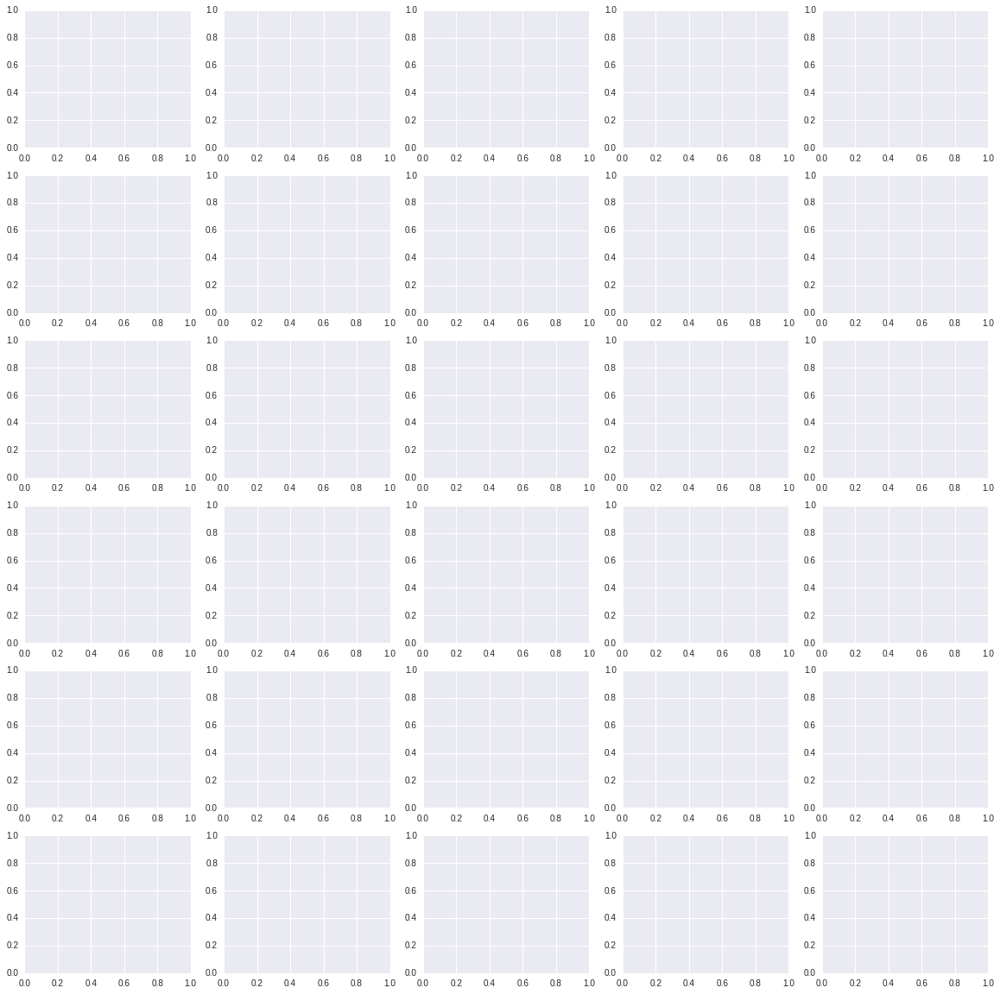

In [18]:
# plot the original signal and the reconstructed one in a same plot

# loop on patients 
for ID in patient_IDs:
    figs, axes = plt.subplots(nrows= 6, ncols= 5,figsize=(20,20),dpi = 200)
    # loop on features
    for idx in range(len(all_highly_corr_features)):
        # get the dominant frequency for this feature assocciated with the patient
        feature = all_highly_corr_features[idx]
        dominant_freq = df_freq[df_freq['patient_IDs'] == ID][feature].iloc[0]
        # check for NaN frequencies
        if np.isnan(dominant_freq):
            # if the frequency is nan, do nothing
            pass
        else:
            # if you have a real frequency, continue
            col_1 = feature
            col_2 = 'dayofstudy'
            # extract the original data
            original_df = FeatureDay[FeatureDay['gls_subject_code'] == ID][[col_1,col_2]]
            # sort the original data based on days of study
            original_df.sort(col_2, inplace = True)
            x = original_df[col_2]
            y = original_df[col_1]
            # remove the outliers from the data
            y,x = remove_outliers(y,x)
            # calculate the index of the plot based on the fact that we have 25 patients
            row = idx // 5
            col = idx % 5
            # plot the original data
            axes[row,col].plot(x,y,label = 'original')
            axes[row,col].set_title(ID,y=0.9)
            axes[row,col].set_xlabel('days of study')
            axes[row,col].set_ylabel(feature)
            # reconstruct the signal using the dominant frequency
            freq, reconstructed_signal = extract_the_most_dominant_freq_and_recosndtruct(y)
            # plot the reconstructed signal(noise filtered) on a same graph as the original one
            axes[row,col].plot(x,reconstructed_signal, label = 'reconstructed')
            axes[row,col].legend(loc = 'best')

In [ ]:
# from subplots above, filter those that are empty 
    # patient missed more than 50% of featue values
    # frequency is null

In [19]:
# extract the number of not NaN values we need a plot for
num_of_plots = 0
for ID in patient_IDs:
    for idx in range(len(all_highly_corr_features)):
        # get the dominant freq for this feature assocciated with the patient
        feature = all_highly_corr_features[idx]
        dominant_freq = df_freq[df_freq['patient_IDs'] == ID][feature].iloc[0]
        # count frequencies which are not NaN
        if np.isnan(dominant_freq):
            pass
        else:
            num_of_plots += 1
num_of_plots

216

In [20]:
# calculate the numbers of rows and columns you will need 
num_of_cols = 5
num_of_rows = num_of_plots//num_of_cols + 1

/opt/python3/lib/python3.5/site-packages/ipykernel/__main__.py:20: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
/opt/python3/lib/python3.5/site-packages/numpy/core/numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


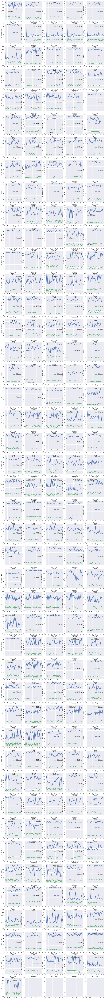

In [39]:
# start plotting: all features with not nan frequency per patient

# count is a variable to keep track of number of plots
count = 0
figs, axes = plt.subplots(nrows= num_of_rows, ncols= num_of_cols,figsize=(20,200),dpi = 200)
# loop on patients
for ID in patient_IDs:
    # loop on features
    for idx in range(len(all_highly_corr_features)):
        # get the dominant frequency for this feature assocciated with the patient
        feature = all_highly_corr_features[idx]
        dominant_freq = df_freq[df_freq['patient_IDs'] == ID][feature].iloc[0]
        # check for the frequency not being nan
        if np.isnan(dominant_freq):
            # if the frequency is nan, do nothing
            pass
        else:
            # if you have a real frequency, continue
            col_1 = feature
            col_2 = 'dayofstudy'
            # extract the original data
            original_df = FeatureDay[FeatureDay['gls_subject_code'] == ID][[col_1,col_2]]
            # sort the original data based on days of study
            original_df.sort(col_2, inplace = True)
            x = original_df[col_2]
            y = original_df[col_1]
            # remove the outliers from the data
            y,x = remove_outliers(y,x)
            # calculate the index of the subplots based on the fact that we have 25 patients 
            row = count // 5
            col = count % 5
            # plot the orignal data
            axes[row,col].plot(x,y,label = 'original')
            axes[row,col].set_title(ID + '\n' + str("%.4f" % dominant_freq[0]), y = '0.9',loc = 'center')
            axes[row,col].set_xlabel('days of study')
            axes[row,col].set_ylabel(feature)
            # reconstruct the signal using the dominant frequency
            freq, reconstructed_signal = extract_the_most_dominant_freq_and_recosndtruct(y)
            # plot the reconstructed signal(noise filtered) on a same graph as the original one
            axes[row,col].plot(x,reconstructed_signal, label = 'reconstructed')
            axes[row,col].legend(loc = 'best')
            # increase the number of plots
            count += 1

/opt/python3/lib/python3.5/site-packages/ipykernel/__main__.py:20: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
/opt/python3/lib/python3.5/site-packages/numpy/core/numeric.py:482: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


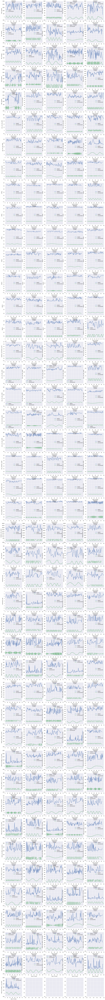

In [40]:
# start plotting: for a feature all patients with not nan freq
# count keeps track of number of plots
count = 0
figs, axes = plt.subplots(nrows= num_of_rows, ncols= num_of_cols,figsize=(20,200),dpi = 200)
for feature in all_highly_corr_features:
    for idx in range(len(patient_IDs)):
        # get the dominant freq for this feature assocciated with the patient
        ID = patient_IDs[idx]
        dominant_freq = df_freq[df_freq['patient_IDs'] == ID][feature].iloc[0]
        if np.isnan(dominant_freq):
            # if the freq is nan, do nothing
            pass
        else:
            # if you have a real freq, continue
            col_1 = feature
            col_2 = 'dayofstudy'
            # extract the original data
            original_df = FeatureDay[FeatureDay['gls_subject_code'] == ID][[col_1,col_2]]
            # sort the original data based on days of study
            original_df.sort(col_2, inplace = True)
            x = original_df[col_2]
            y = original_df[col_1]
            # remove the outliers from the data
            y,x = remove_outliers(y,x)
            # calculate the index of the plot and plot
            row = count // 5
            col = count % 5
            axes[row,col].plot(x,y,label = 'original')
            axes[row,col].set_title(ID + '\n' + str("%.4f" % dominant_freq[0]), y = '0.9',loc = 'center')
            axes[row,col].set_xlabel('days of study')
            axes[row,col].set_ylabel(feature)
            # reconstruct the signal using the dominant freq
            freq, reconstructed_signal = extract_the_most_dominant_freq_and_recosndtruct(y)
            # plot the reconstructed signal(noise filtered) on a same graph as the original one
            axes[row,col].plot(x,reconstructed_signal, label = 'reconstructed')
            axes[row,col].legend(loc = 'best')
            # increase the number of plots
            count += 1

In [131]:
df_freq

,patient_IDs,idle_minutes,turn_vel_std_ankle,swing,stance,duration_movement_count,turn_vel_max_ankle,turn_duration_ankle,duration_rem_count,rem_percent,...,turn_vel_std_at_home,turn_duration_ankle_at_home,turn_vel_max_ankle_at_home,mean_pvt_delay_5_at_home,zx_nondominant_median_at_home,zx_nondominant_num_correct_at_home,mean_pvt_delay_3_at_home,turn_vel_std_ankle_at_home,mobility_activity_at_home_time,mean_pvt_delay_1_at_home
0,H800001,[0.111111111111],[0.133333333333],[0.46511627907],[0.25],NaN,[0.377777777778],[0.3],NaN,NaN,...,NaN,NaN,NaN,[0.488888888889],NaN,NaN,[0.488888888889],NaN,NaN,[0.159090909091]
1,H800002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,H800003,[0.28125],[0.16],[0.163265306122],[0.137254901961],NaN,[0.12],[0.24],NaN,NaN,...,NaN,NaN,NaN,[0.0925925925926],NaN,NaN,[0.448275862069],NaN,NaN,[0.122807017544]
3,H800004,[0.316666666667],[0.0961538461538],[0.30612244898],[0.0408163265306],[0.309523809524],[0.0980392156863],[0.326086956522],[0.285714285714],[0.047619047619],...,NaN,NaN,NaN,[0.0555555555556],NaN,NaN,[0.0175438596491],NaN,NaN,[0.25]
4,H800006,[0.0576923076923],[0.288461538462],[0.0869565217391],[0.0392156862745],NaN,[0.02],[0.0434782608696],NaN,NaN,...,NaN,NaN,NaN,[0.025],NaN,NaN,[0.139534883721],NaN,NaN,[0.488372093023]
5,H800007,[0.075],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,H800008,[0.48],[0.219512195122],[0.404761904762],[0.175],[0.235294117647],[0.3],[0.195652173913],[-0.5],[0.4],...,NaN,NaN,NaN,[0.0204081632653],NaN,NaN,[0.34693877551],NaN,NaN,[0.02]
7,H800009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,H800010,[0.258620689655],[0.16],[0.12],[0.163265306122],[0.228571428571],[0.156862745098],[0.153846153846],NaN,NaN,...,NaN,NaN,NaN,[0.22],NaN,NaN,[0.0196078431373],NaN,NaN,[0.0212765957447]
9,H800011,[0.0980392156863],[0.0243902439024],[0.138888888889],[0.473684210526],NaN,[0.025],[0.282051282051],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


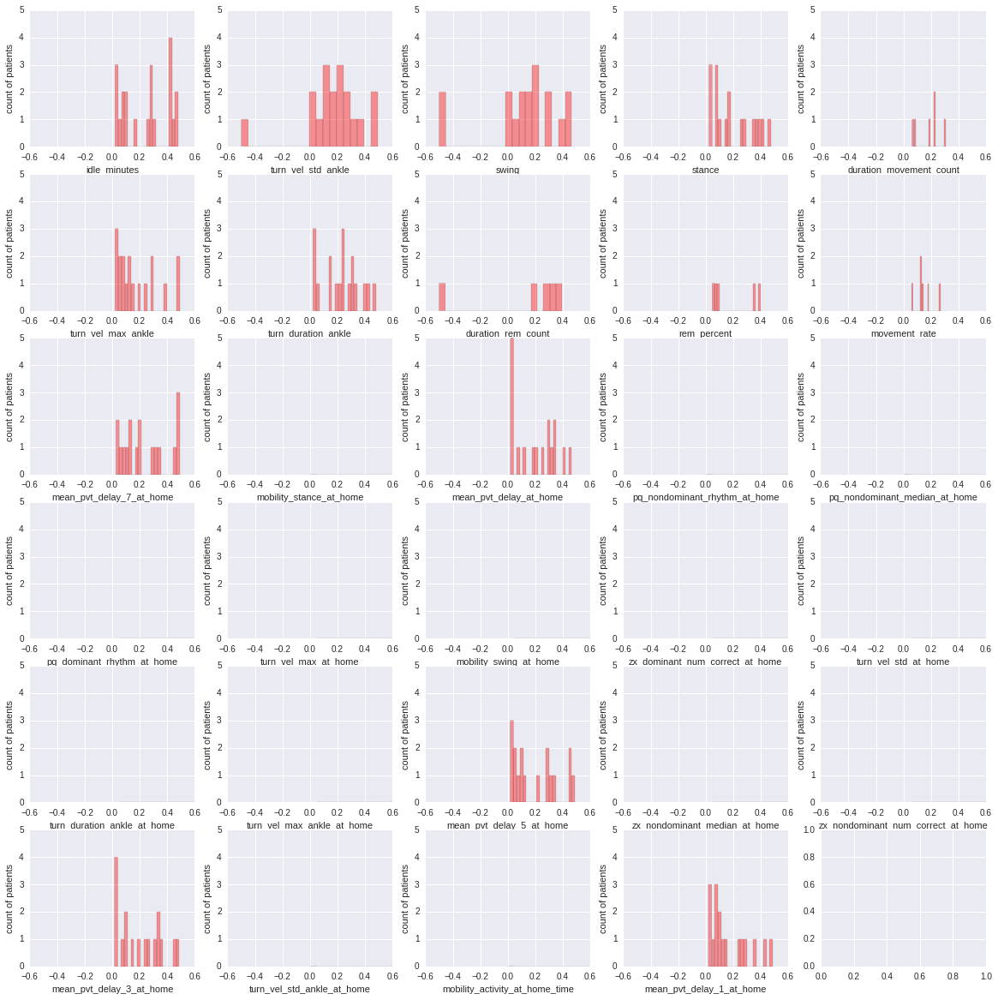

In [42]:
# how many patients have fall into a same range of frequency for a feature
figs, axes = plt.subplots(nrows= 6, ncols= 5,figsize=(20,20),dpi = 200)
# loop on features
for idx in range(len(all_highly_corr_features)):
    feature = all_highly_corr_features[idx]
    row = idx // 5
    col = idx % 5
    # ditribution plot on frequncy of change for the feature through all patients
    sns.distplot(df_freq[feature].dropna(), bins=20, kde = False, ax=axes[row][col], color='r')
    axes[row][col].set_xlim(-.6,0.6)
    axes[row][col].set_ylim(0,5)
    axes[row][col].set_ylabel('count of patients')

/opt/python3/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)


error H800007
error H800024
error H800005


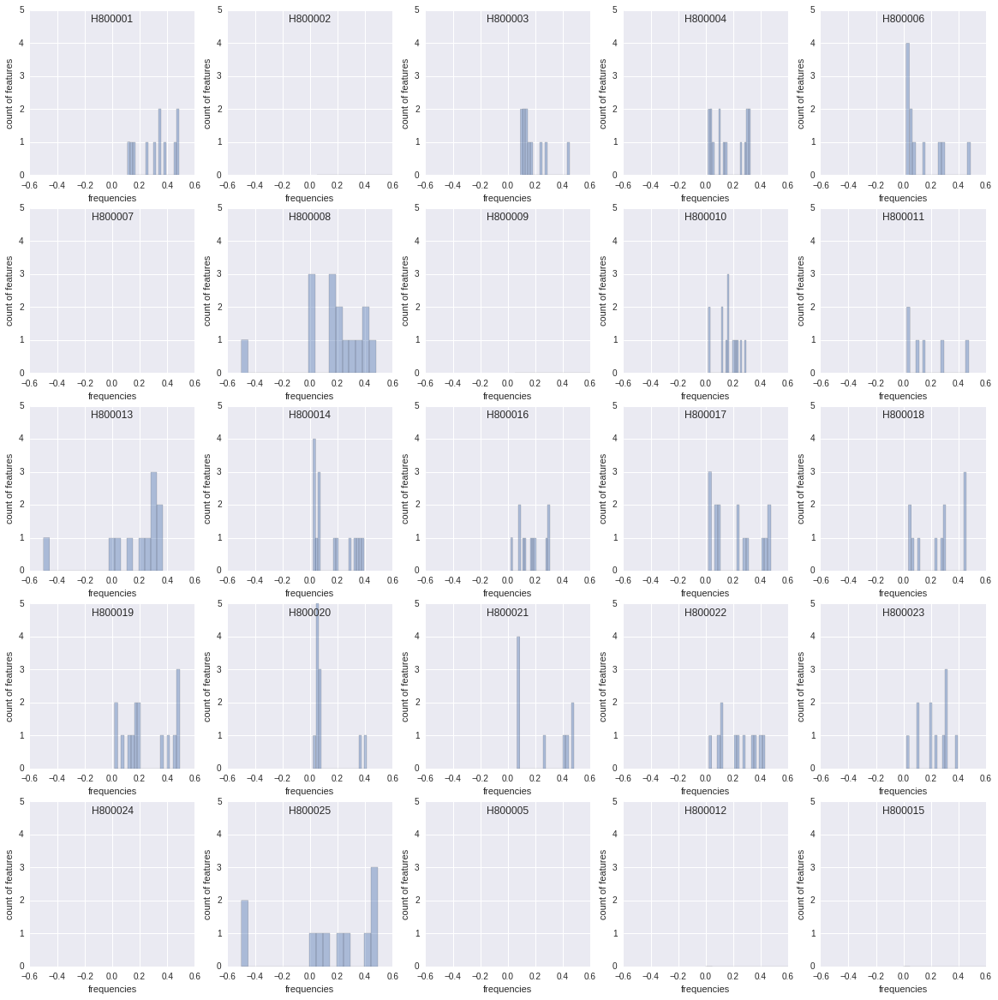

In [43]:
# for a patient, how many features have a close range of frequencies 
figs, axes = plt.subplots(nrows= 5, ncols= 5,figsize=(20,20),dpi = 200)
# loop on patients
for idx in range(len(patient_IDs)):
    ID = patient_IDs[idx]
    row = idx // 5
    col = idx % 5
    # distribution plot on frequency of change in all sensor features for the patient
    try:
        sns.distplot(df_freq.iloc[idx][1:].dropna(), bins=20, kde = False, ax=axes[row][col])
    except:
        print('error '+ ID)  
    axes[row][col].set_xlim(-.6,0.6)
    axes[row][col].set_ylim(0,5)
    axes[row][col].set_ylabel('count of features')
    axes[row][col].set_xlabel('frequencies')
    axes[row][col].set_title(ID, y = 0.9)

In [21]:
# for each feature, how many patients miss more than 50% of values
df_freq.isnull().sum()

patient_IDs                            0
idle_minutes                           4
turn_vel_std_ankle                     7
swing                                  8
stance                                 8
duration_movement_count               19
turn_vel_max_ankle                     7
turn_duration_ankle                    7
duration_rem_count                    20
rem_percent                           20
movement_rate                         19
mean_pvt_delay_7_at_home               8
mobility_stance_at_home               25
mean_pvt_delay_at_home                 8
pq_nondominant_rhythm_at_home         25
pq_nondominant_median_at_home         25
pq_dominant_rhythm_at_home            25
turn_vel_max_at_home                  25
mobility_swing_at_home                25
zx_dominant_num_correct_at_home       25
turn_vel_std_at_home                  25
turn_duration_ankle_at_home           25
turn_vel_max_ankle_at_home            25
mean_pvt_delay_5_at_home               8
zx_nondominant_m

In [22]:
# preprocessing step: fix the df_freq
# transform arrays with one element to a float
def func(element):
    if np.isnan(element):
        return np.nan
    else:
        return element[0]
    
df_freq_new = pd.DataFrame()
df_freq_new['patient_IDs'] = patient_IDs
for feature in all_highly_corr_features:
    df_freq_new[feature] = df_freq[feature].apply(func)
    
df_freq_new.head()

,patient_IDs,idle_minutes,turn_vel_std_ankle,swing,stance,duration_movement_count,turn_vel_max_ankle,turn_duration_ankle,duration_rem_count,rem_percent,...,turn_vel_std_at_home,turn_duration_ankle_at_home,turn_vel_max_ankle_at_home,mean_pvt_delay_5_at_home,zx_nondominant_median_at_home,zx_nondominant_num_correct_at_home,mean_pvt_delay_3_at_home,turn_vel_std_ankle_at_home,mobility_activity_at_home_time,mean_pvt_delay_1_at_home
0,H800001,0.111111,0.133333,0.465116,0.250000,NaN,0.377778,0.300000,NaN,NaN,...,NaN,NaN,NaN,0.488889,NaN,NaN,0.488889,NaN,NaN,0.159091
1,H800002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,H800003,0.281250,0.160000,0.163265,0.137255,NaN,0.120000,0.240000,NaN,NaN,...,NaN,NaN,NaN,0.092593,NaN,NaN,0.448276,NaN,NaN,0.122807
3,H800004,0.316667,0.096154,0.306122,0.040816,0.309524,0.098039,0.326087,0.285714,0.047619,...,NaN,NaN,NaN,0.055556,NaN,NaN,0.017544,NaN,NaN,0.250000
4,H800006,0.057692,0.288462,0.086957,0.039216,NaN,0.020000,0.043478,NaN,NaN,...,NaN,NaN,NaN,0.025000,NaN,NaN,0.139535,NaN,NaN,0.488372


In [23]:
# how many patients have null frequencies for a feature?
    # how many patients miss more than 50% of values for a feature?
# if a feature has null frequencies for all patients, we want to ignore that feature
df_temp = df_freq_new.isnull().sum() 
all_null_features = list(df_temp[df_temp == 25].index)
all_null_features

['mobility_stance_at_home',
 'pq_nondominant_rhythm_at_home',
 'pq_nondominant_median_at_home',
 'pq_dominant_rhythm_at_home',
 'turn_vel_max_at_home',
 'mobility_swing_at_home',
 'zx_dominant_num_correct_at_home',
 'turn_vel_std_at_home',
 'turn_duration_ankle_at_home',
 'turn_vel_max_ankle_at_home',
 'zx_nondominant_median_at_home',
 'zx_nondominant_num_correct_at_home',
 'turn_vel_std_ankle_at_home',
 'mobility_activity_at_home_time']

In [24]:
# for a patient, how many feature frequencies are missing?
df_freq.isnull().sum(axis = 1)

0     18
1     29
2     18
3     14
4     18
5     28
6     14
7     29
8     16
9     23
10    18
11    14
12    18
13    14
14    18
15    14
16    18
17    20
18    18
19    18
20    28
21    18
22    28
23    29
24    29
dtype: int64

In [25]:
# patients that miss more than 50% of days for all the features
patients_null = []
for i in range(len(df_freq.isnull().sum(axis = 1))):
    if df_freq.isnull().sum(axis = 1)[i] == 29:
        patients_null.append(patient_IDs[i])    
patients_null        

['H800002', 'H800009', 'H800012', 'H800015']

In [26]:
# average on all feature frequencies for each patient
ave_row = pd.DataFrame()
ave_row['patient_IDs'] = df_freq['patient_IDs']
ave = []
for idx in range(len(patient_IDs)):
    ave.append(df_freq.iloc[idx][1:].mean())
ave_row['ave_freq'] = ave
ave_row

,patient_IDs,ave_freq
0,H800001,[0.314184124544]
1,H800002,NaN
2,H800003,[0.180329772588]
3,H800004,[0.162746447708]
4,H800006,[0.133831688656]
5,H800007,[0.075]
6,H800008,[0.176123366535]
7,H800009,NaN
8,H800010,[0.16316680071]
9,H800011,[0.173675640176]


In [27]:
# average on frequency of change through all patients for a specific feature
ave_col = pd.DataFrame()
ave_col['features'] = all_highly_corr_features
ave = []
for feature in all_highly_corr_features:
    ave.append(df_freq[feature].mean())
ave_col['ave_freq'] = ave
ave_col

,features,ave_freq
0,idle_minutes,[0.246122656677]
1,turn_vel_std_ankle,[0.173411626967]
2,swing,[0.122287173975]
3,stance,[0.203880431787]
4,duration_movement_count,[0.184949813259]
5,turn_vel_max_ankle,[0.178035427017]
6,turn_duration_ankle,[0.228310416109]
7,duration_rem_count,[0.134328171828]
8,rem_percent,[0.190774471951]
9,movement_rate,[0.151724678621]


In [28]:
# eleminate features for which all patients are missing more than 50% of values
print(df_freq.shape)
df_freq_new.drop(all_null_features,axis=1,inplace=True)
print(df_freq_new.shape)
df_freq_new.head()

(25, 30)
(25, 16)


,patient_IDs,idle_minutes,turn_vel_std_ankle,swing,stance,duration_movement_count,turn_vel_max_ankle,turn_duration_ankle,duration_rem_count,rem_percent,movement_rate,mean_pvt_delay_7_at_home,mean_pvt_delay_at_home,mean_pvt_delay_5_at_home,mean_pvt_delay_3_at_home,mean_pvt_delay_1_at_home
0,H800001,0.111111,0.133333,0.465116,0.250000,NaN,0.377778,0.300000,NaN,NaN,NaN,0.340909,0.340909,0.488889,0.488889,0.159091
1,H800002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,H800003,0.281250,0.160000,0.163265,0.137255,NaN,0.120000,0.240000,NaN,NaN,NaN,0.090909,0.127273,0.092593,0.448276,0.122807
3,H800004,0.316667,0.096154,0.306122,0.040816,0.309524,0.098039,0.326087,0.285714,0.047619,0.142857,0.129630,0.018868,0.055556,0.017544,0.250000
4,H800006,0.057692,0.288462,0.086957,0.039216,NaN,0.020000,0.043478,NaN,NaN,NaN,0.027027,0.256410,0.025000,0.139535,0.488372


In [31]:
def corr_and_p_values(df):
    # calculating p values along with correlation values for a dataframe
    # input: a dataframe
    # output: the correlation and p values between each pair of clolumns in the input data frame
    import numpy as np
    import pandas as pd
    from scipy.stats import pearsonr

    coeffmat = np.zeros((df.shape[1], df.shape[1]))
    pvalmat = np.zeros((df.shape[1], df.shape[1]))

    for i in range(df.shape[1]):    
        for j in range(df.shape[1]): 
            column1 = df.columns[i]
            column2 = df.columns[j]
            # drop all null values
            # pearsonr cannot handle null values in data(will return null for the whole)
            df_clean = df[[column1, column2]].dropna()
            df_clean.columns = [column1 + '_1', column2 + '_2']
            corrtest = pearsonr(df_clean[column1 + '_1'], df_clean[column2 + '_2'])

            coeffmat[i,j] = corrtest[0]
            pvalmat[i,j] = corrtest[1]
    # create a new dataframe with correlation and p values included
    dfcoeff = pd.DataFrame(coeffmat, columns=df.columns, index=df.columns)
    dfpvals = pd.DataFrame(pvalmat, columns=df.columns, index=df.columns)
    # return the new dataframe
    return dfcoeff, dfpvals

In [32]:
def extract_high_corr_low_p_value(dfcoeff,dfpvals,corr_th,p_th):
    # look at the p values of highly correlated features
    # input: correlation values and p values data frames, threshold for correlation and p values
    # output: highly correlated features with low p values
    feature_1 = []
    feature_2 = []
    corr_values = []
    p_values = []
    for col in list(dfcoeff.columns):
        for row in list(dfcoeff.index):
            # look for high correlation wth low p values
            if (np.abs(dfcoeff[col][row]) >= corr_th) & (dfpvals[col][row] <= p_th):
                # ignore the diagonal features
                if row != col:
                    corr_val = dfcoeff[col][row]
                    p_val = dfpvals[col][row]
                    feature_1.append(col)
                    feature_2.append(row)
                    corr_values.append(corr_val)
                    p_values.append(p_val)
    res = pd.DataFrame()
    res['feature_1'] = feature_1
    res['feature_2'] = feature_2
    res['corr_values'] = corr_values
    res['p_values'] = p_values
    return res

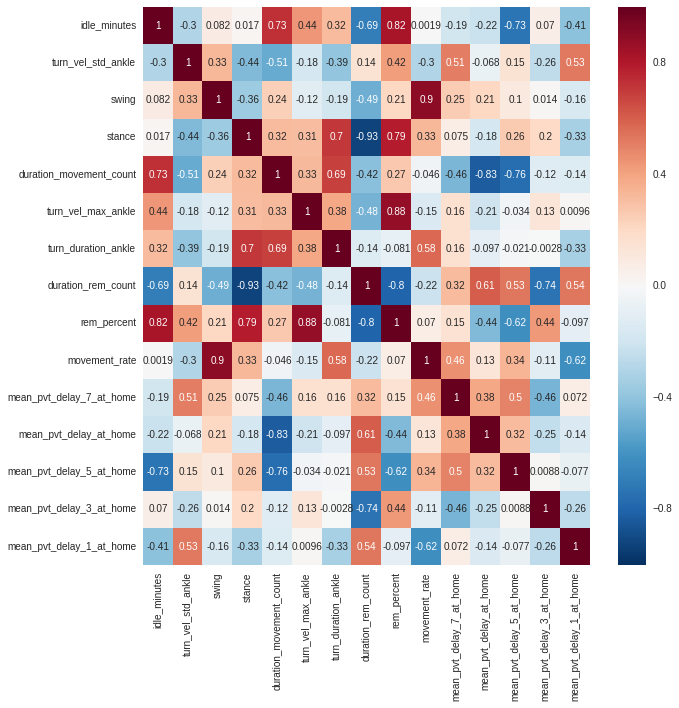

In [33]:
# find correlation, make the heatmap
plt.figure(figsize=(10,10))
sns.heatmap(df_freq_new.corr(), annot=True)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

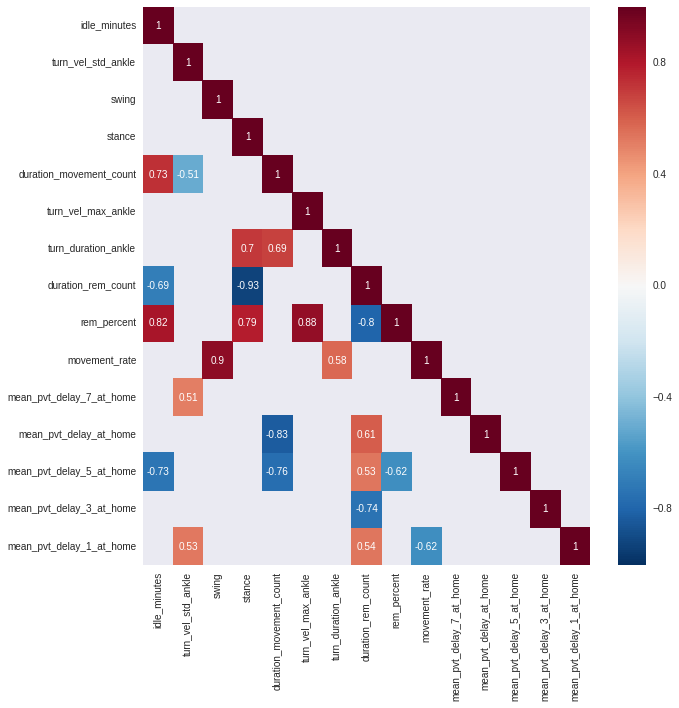

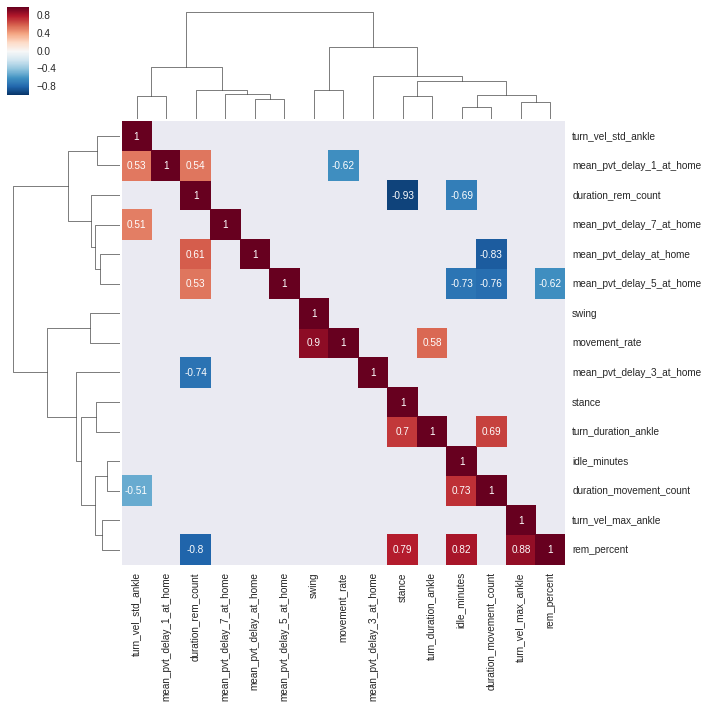

In [34]:
# make the low corelated values to mask from the heatmap
def func(x):
    if (x > -0.5) & (x < 0.50):
        return True
    else:
        return False
    
df = df_freq_new.corr()

# make a mask dataframe
mask = df.isnull()
for name in list(df.columns):
    mask[name] = df[name].apply(func)
# mask top half of the map as it is symmetrical
(row,col) = mask.shape
for i in range(row):
    for j in range(col):
        if j > i:
            mask.iloc[i][j] = True
# plot the heatmap
plt.figure(figsize=(10,10))
sns.heatmap(df, mask = mask, annot=True)
# plot the clustermap
cg = sns.clustermap(df, metric="correlation", annot=True, mask=mask)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

In [35]:
# create a dataframe with patient IDs, all MSFC component scores for clinical visits 2 and 3
patient_ID = []
msfc_composite_2 = []
msfc_composite_3 = []
msfc_walk_composite_2 = []
msfc_walk_composite_3 = []
msfc_9hpt_composite_2 = []
msfc_9hpt_composite_3 = []
msfc_sdmt_composite_2 = [] 
msfc_sdmt_composite_3 = []
msfc_snellen_composite_2 = []
msfc_snellen_composite_3 = []

for idx in range(len(patient_IDs)):
    ID = patient_IDs[idx]
    df = FeatureDay[FeatureDay['gls_subject_code'] == ID][['msfc_walk_composite_2',
 'msfc_9hpt_composite_2',
 'msfc_sdmt_composite_2',
 'msfc_snellen_composite_2',
 'msfc_composite_2',
 'msfc_walk_composite_3',
 'msfc_9hpt_composite_3',
 'msfc_sdmt_composite_3',
 'msfc_snellen_composite_3',
 'msfc_composite_3']]
    
    patient_ID.append(ID)
    msfc_composite_2.append(df.iloc[0]['msfc_composite_2'])
    msfc_composite_3.append(df.iloc[0]['msfc_composite_3'])
    msfc_walk_composite_2.append(df.iloc[0]['msfc_walk_composite_2'])
    msfc_walk_composite_3.append(df.iloc[0]['msfc_walk_composite_3'])
    msfc_9hpt_composite_2.append(df.iloc[0]['msfc_9hpt_composite_2'])
    msfc_9hpt_composite_3.append(df.iloc[0]['msfc_9hpt_composite_3'])
    msfc_sdmt_composite_2.append(df.iloc[0]['msfc_sdmt_composite_2'])
    msfc_sdmt_composite_3.append(df.iloc[0]['msfc_sdmt_composite_3'])
    msfc_snellen_composite_2.append(df.iloc[0]['msfc_snellen_composite_2'])
    msfc_snellen_composite_3.append(df.iloc[0]['msfc_snellen_composite_3'])
    
all_data = []
all_data.append(patient_ID)
all_data.append(msfc_composite_2)
all_data.append(msfc_composite_3)
all_data.append(msfc_walk_composite_2)
all_data.append(msfc_walk_composite_3)
all_data.append(msfc_9hpt_composite_2)
all_data.append(msfc_9hpt_composite_3)
all_data.append(msfc_sdmt_composite_2)
all_data.append(msfc_sdmt_composite_3)
all_data.append(msfc_snellen_composite_2)
all_data.append(msfc_snellen_composite_3)
all_data = list(zip(*all_data))

cols = ['patient_ID',
 'msfc_composite_2',
 'msfc_composite_3',
 'msfc_walk_composite_2',
 'msfc_walk_composite_3',
 'msfc_9hpt_composite_2',
 'msfc_9hpt_composite_3',
 'msfc_sdmt_composite_2',
 'msfc_sdmt_composite_3',
 'msfc_snellen_composite_2','msfc_snellen_composite_3']
df_MSFC_all = pd.DataFrame(all_data, columns=cols)
df_MSFC_all.head()

,patient_ID,msfc_composite_2,msfc_composite_3,msfc_walk_composite_2,msfc_walk_composite_3,msfc_9hpt_composite_2,msfc_9hpt_composite_3,msfc_sdmt_composite_2,msfc_sdmt_composite_3,msfc_snellen_composite_2,msfc_snellen_composite_3
0,H800001,-1.385647,-1.407630,-0.488279,-0.349300,-1.899765,-2.181329,-1.668083,-1.613428,-1.486462,-1.486462
1,H800002,1.109154,0.631568,0.924672,0.855183,1.261261,0.582956,0.955377,0.791410,1.295305,0.296722
2,H800003,0.932657,0.911542,0.693041,0.808856,0.896217,1.078528,0.846066,0.463478,1.295305,1.295305
3,H800004,-0.983236,-0.695738,-0.279811,-0.163995,-0.717212,-0.510256,-1.449462,-1.121529,-1.486462,-0.987171
4,H800006,0.568276,0.495086,0.669878,0.693041,0.569751,1.019000,0.736755,-0.028421,0.296722,0.296722


In [36]:
# create a dataframe with absolute difference between composite scores in clinical visits 2 & 3
df_MSFC_diff = pd.DataFrame(patient_IDs,columns=['patient_IDs'])
col_1 = 'msfc_composite_2'
col_2 = 'msfc_composite_3'    
df_MSFC_diff['msfc_composite_diff_2_3'] = np.abs(df_MSFC_all[col_2] - df_MSFC_all[col_1])

col_1 = 'msfc_walk_composite_2'
col_2 = 'msfc_walk_composite_3'    
df_MSFC_diff['msfc_walk_composite_diff_2_3'] = np.abs(df_MSFC_all[col_2] - df_MSFC_all[col_1])

col_1 = 'msfc_9hpt_composite_2'
col_2 = 'msfc_9hpt_composite_3'    
df_MSFC_diff['msfc_9hpt_composite_diff_2_3'] = np.abs(df_MSFC_all[col_2] - df_MSFC_all[col_1])

col_1 = 'msfc_sdmt_composite_2'
col_2 = 'msfc_sdmt_composite_3'    
df_MSFC_diff['msfc_sdmt_composite_diff_2_3'] = np.abs(df_MSFC_all[col_2] - df_MSFC_all[col_1])

col_1 = 'msfc_snellen_composite_2'
col_2 = 'msfc_snellen_composite_3'    
df_MSFC_diff['msfc_snellen_composite_diff_2_3'] = np.abs(df_MSFC_all[col_2] - df_MSFC_all[col_1])

df_MSFC_diff.head()

,patient_IDs,msfc_composite_diff_2_3,msfc_walk_composite_diff_2_3,msfc_9hpt_composite_diff_2_3,msfc_sdmt_composite_diff_2_3,msfc_snellen_composite_diff_2_3
0,H800001,0.021982,0.138979,0.281564,0.054655,0.000000
1,H800002,0.477586,0.069489,0.678305,0.163966,0.998583
2,H800003,0.021115,0.115816,0.182311,0.382588,0.000000
3,H800004,0.287499,0.115816,0.206956,0.327933,0.499291
4,H800006,0.073191,0.023163,0.449249,0.765176,0.000000


In [37]:
# create a new dataframe with frequencies and differences between MSFC scores combined
df_freq_new_and_msfc_diff_abs = pd.concat([df_freq_new,df_MSFC_diff],axis=1)

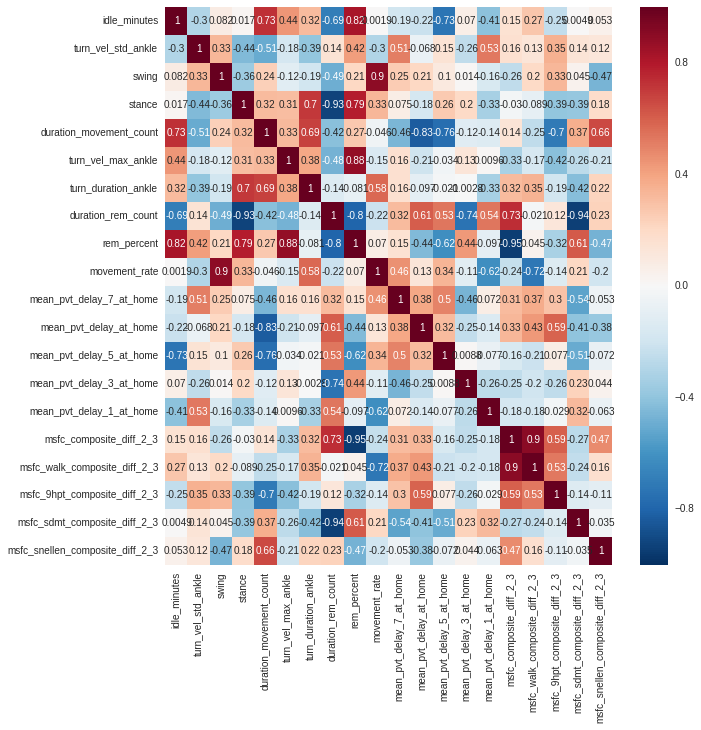

In [38]:
# find the correlation between freqencies and change in MSFC scores(all the components)
plt.figure(figsize=(10,10))
sns.heatmap(df_freq_new_and_msfc_diff_abs.corr(), annot=True)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

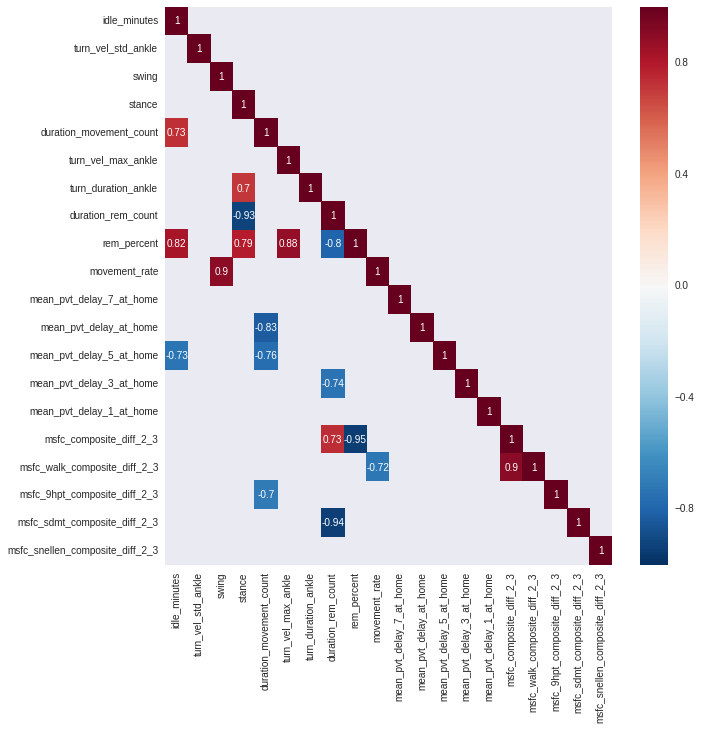

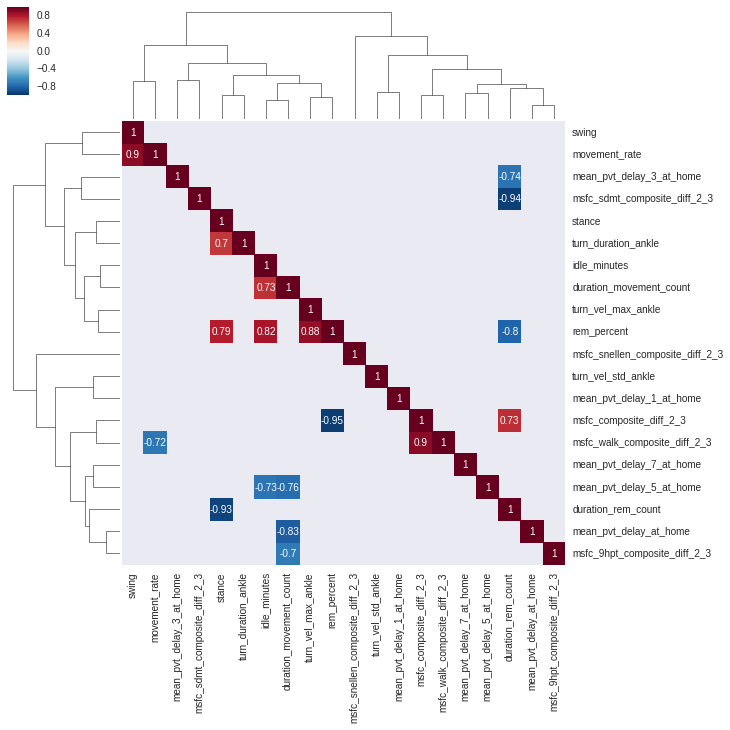

In [39]:
# make the low corelated values to mask from the heatmap
def func(x):
    if (x > -0.7) & (x < 0.70):
        return True
    else:
        return False
    
df = df_freq_new_and_msfc_diff_abs.corr()

# make a mask dataframe
mask = df.isnull()
for name in list(df.columns):
    mask[name] = df[name].apply(func)
# mask top half of the map as it is symmetrical
(row,col) = mask.shape
for i in range(row):
    for j in range(col):
        if j > i:
            mask.iloc[i][j] = True
# plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(df, mask=mask, annot=True)
# plot the clustermap
cg = sns.clustermap(df, metric="correlation", annot=True, mask=mask)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

In [40]:
# look at features with high correlations and low p values
# set the threshold for correlation and p values
corr_th = 0.6
p_th = 0.05

df = df_freq_new_and_msfc_diff_abs.drop('patient_IDs',axis=1)
dfcoeff, dfpvals = corr_and_p_values(df)
res = extract_high_corr_low_p_value(dfcoeff,dfpvals,corr_th,p_th)

dfcoeff.head()
dfpvals.head()
res

,feature_1,feature_2,corr_values,p_values
0,idle_minutes,mean_pvt_delay_5_at_home,-0.727265,9.389663e-04
1,swing,movement_rate,0.896737,1.544435e-02
2,stance,turn_duration_ankle,0.703749,1.618057e-03
3,stance,duration_rem_count,-0.929205,2.237028e-02
4,duration_movement_count,mean_pvt_delay_at_home,-0.832071,3.993252e-02
5,turn_vel_max_ankle,rem_percent,0.879527,4.927854e-02
6,turn_duration_ankle,stance,0.703749,1.618057e-03
7,duration_rem_count,stance,-0.929205,2.237028e-02
8,duration_rem_count,msfc_sdmt_composite_diff_2_3,-0.937915,1.839638e-02
9,rem_percent,turn_vel_max_ankle,0.879527,4.927854e-02


In [41]:
# create a dataframe with difference between composite scores (no absolute value)
    # considering direction of change in calculating the correlations.
df_MSFC_diff = pd.DataFrame(patient_IDs,columns=['patient_IDs'])
col_1 = 'msfc_composite_2'
col_2 = 'msfc_composite_3'    
df_MSFC_diff['msfc_composite_diff_2_3'] = df_MSFC_all[col_2] - df_MSFC_all[col_1]

col_1 = 'msfc_walk_composite_2'
col_2 = 'msfc_walk_composite_3'    
df_MSFC_diff['msfc_walk_composite_diff_2_3'] = df_MSFC_all[col_2] - df_MSFC_all[col_1]

col_1 = 'msfc_9hpt_composite_2'
col_2 = 'msfc_9hpt_composite_3'    
df_MSFC_diff['msfc_9hpt_composite_diff_2_3'] = df_MSFC_all[col_2] - df_MSFC_all[col_1]

col_1 = 'msfc_sdmt_composite_2'
col_2 = 'msfc_sdmt_composite_3'    
df_MSFC_diff['msfc_sdmt_composite_diff_2_3'] = df_MSFC_all[col_2] - df_MSFC_all[col_1]

col_1 = 'msfc_snellen_composite_2'
col_2 = 'msfc_snellen_composite_3'    
df_MSFC_diff['msfc_snellen_composite_diff_2_3'] = df_MSFC_all[col_2] - df_MSFC_all[col_1]

df_MSFC_diff

,patient_IDs,msfc_composite_diff_2_3,msfc_walk_composite_diff_2_3,msfc_9hpt_composite_diff_2_3,msfc_sdmt_composite_diff_2_3,msfc_snellen_composite_diff_2_3
0,H800001,-0.021982,0.138979,-0.281564,0.054655,0.000000
1,H800002,-0.477586,-0.069489,-0.678305,-0.163966,-0.998583
2,H800003,-0.021115,0.115816,0.182311,-0.382588,0.000000
3,H800004,0.287499,0.115816,0.206956,0.327933,0.499291
4,H800006,-0.073191,0.023163,0.449249,-0.765176,0.000000
5,H800007,0.218346,0.115816,0.429636,0.327933,0.000000
6,H800008,0.002611,-0.162142,-0.428626,0.601210,0.000000
7,H800009,NaN,NaN,NaN,NaN,NaN
8,H800010,0.284052,0.046326,0.519262,0.000000,0.570619
9,H800011,-0.137417,0.069489,-0.455190,-0.163966,0.000000


In [42]:
# create a new dataframe with frequencies and differences between MSFC scores combined (no absolute value)
df_freq_new_and_msfc_diff = pd.concat([df_freq_new,df_MSFC_diff],axis=1)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

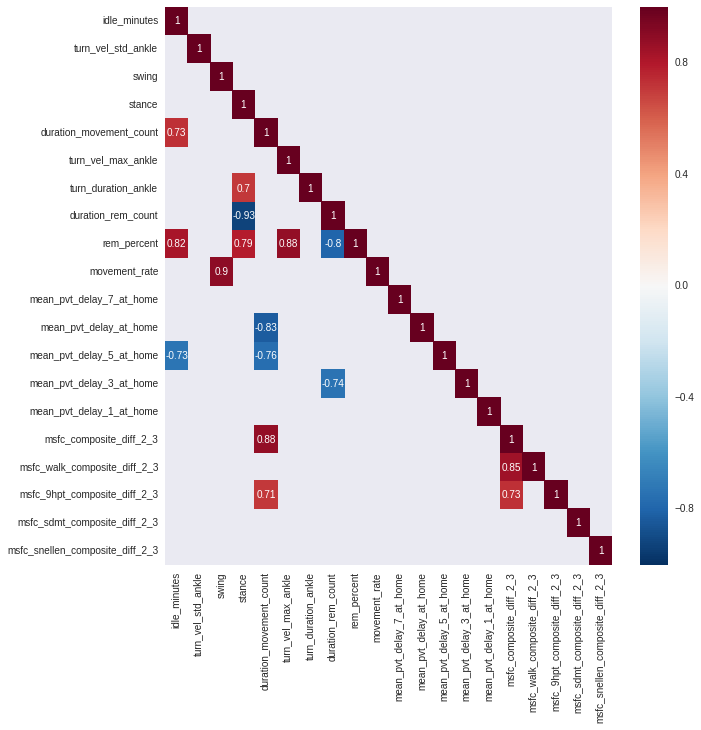

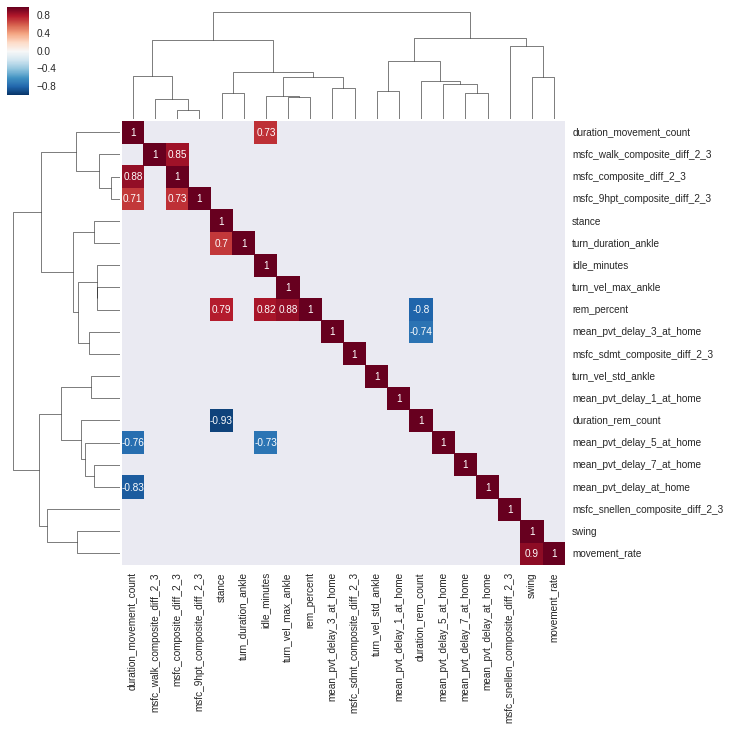

In [43]:
# make the low corelated values to mask from the heatmap
def func(x):
    if (x > -0.7) & (x < 0.70):
        return True
    else:
        return False
    
df = df_freq_new_and_msfc_diff.corr()

# make a mask dataframe
mask = df.isnull()
for name in list(df.columns):
    mask[name] = df[name].apply(func)
# mask top half of the map as it is symmetrical
(row,col) = mask.shape
for i in range(row):
    for j in range(col):
        if j > i:
            mask.iloc[i][j] = True
# plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(df, mask=mask, annot=True)
# plot the clustermap
cg = sns.clustermap(df, metric="correlation", annot=True, mask=mask)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

In [44]:
# look at features with high correlations and low p values
# set the thresholds for correlation and p values
corr_th = 0.6
p_th = 0.05

df = df_freq_new_and_msfc_diff.drop('patient_IDs',axis=1)
dfcoeff, dfpvals = corr_and_p_values(df)
res = extract_high_corr_low_p_value(dfcoeff,dfpvals,corr_th,p_th)

dfcoeff.head()
dfpvals.head()
res

,feature_1,feature_2,corr_values,p_values
0,idle_minutes,mean_pvt_delay_5_at_home,-0.727265,0.000939
1,swing,movement_rate,0.896737,0.015444
2,stance,turn_duration_ankle,0.703749,0.001618
3,stance,duration_rem_count,-0.929205,0.022370
4,duration_movement_count,mean_pvt_delay_at_home,-0.832071,0.039933
5,duration_movement_count,msfc_composite_diff_2_3,0.879000,0.021076
6,turn_vel_max_ankle,rem_percent,0.879527,0.049279
7,turn_duration_ankle,stance,0.703749,0.001618
8,duration_rem_count,stance,-0.929205,0.022370
9,rem_percent,turn_vel_max_ankle,0.879527,0.049279


In [ ]:
# Considering the direction of change is necessary in finding the correlation between frequency of change 
# in sensor-derived features and change in MSFC scores between clinical visits 2 & 3.
    # given the explanation above, the table created in previous cell is the final result for this part of analysis. 